#  <font color=yellow> Importing dataset and packages<font>

In [ ]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import spacy
nlp = spacy.load('en_core_web_sm') 
from keras.layers import Bidirectional
from google.colab import drive
from mpl_toolkits.axes_grid1 import ImageGrid
import tensorflow as tf
from sklearn.feature_extraction.text import CountVectorizer
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
import re
from keras.preprocessing.text import Tokenizer
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models import KeyedVectors
import plotly.graph_objects as go
import plotly.express as px
from sklearn.metrics import confusion_matrix,classification_report
import seaborn as sns
from keras.layers import GaussianNoise
import sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.dummy import DummyClassifier 
from sklearn.utils import class_weight as cw
! pip install datasets
from datasets import Dataset
! pip install datasets
from datasets import Dataset
! pip install transformers
from transformers import AutoModelForSequenceClassification
import torch
import sklearn.metrics
from sklearn.metrics import accuracy_score, f1_score, ConfusionMatrixDisplay, confusion_matrix
from transformers import AutoTokenizer
from wordcloud import WordCloud, STOPWORDS
from sklearn.utils import class_weight as cw
import tensorflow_hub as hub
import unicodedata
from tensorflow import keras
from tensorflow.keras.layers import Dense,Dropout, Input
from tqdm import tqdm
import matplotlib.pyplot as plt
import itertools
from tensorflow.keras import regularizers
from transformers import *
from transformers import BertTokenizer, TFBertModel, BertConfig,TFDistilBertModel,DistilBertTokenizer,DistilBertConfig
!pip install umap-learn
import umap.umap_ as umap
from sklearn.preprocessing import MinMaxScaler
from transformers import AutoModel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 452 kB 4.1 MB/s 
     |████████████████████████████████| 132 kB 80.0 MB/s 
     |████████████████████████████████| 182 kB 80.8 MB/s 
     |████████████████████████████████| 212 kB 80.8 MB/s 
     |████████████████████████████████| 127 kB 59.8 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.8 MB 4.2 MB/s 
     |████████████████████████████████| 7.6 MB 76.9 MB/s 


In [ ]:
nlp = spacy.load('en_core_web_sm', disable = ['tagger', 'parser', 'ner', 'lemmatizer', 'attribute_ruler'])

In [ ]:
url = 'https://raw.githubusercontent.com/nluninja/nlp_datasets/main/emotion_classification_dataset/data/emotion.data'
df = pd.read_csv(url)

In [ ]:
df

,Unnamed: 0,text,emotions
0,27383,i feel awful about it too because it s my job ...,sadness
1,110083,im alone i feel awful,sadness
2,140764,ive probably mentioned this before but i reall...,joy
3,100071,i was feeling a little low few days back,sadness
4,2837,i beleive that i am much more sensitive to oth...,love
...,...,...,...
416804,566,that was what i felt when i was finally accept...,joy
416805,36236,i take every day as it comes i m just focussin...,fear
416806,76229,i just suddenly feel that everything was fake,sadness
416807,131640,im feeling more eager than ever to claw back w...,joy


Our dataset contains $416809$ sentences labelled as one of the following emotions:
*surprise, love, fear, anger, sadness, joy*.

The aim of this project is to build a model to predict the emotions associated to new sentences. 

#  <font color=yellow> Exploratory Data Analysis <font>

In [ ]:
df.columns

Index(['Unnamed: 0', 'text', 'emotions'], dtype='object')

In [ ]:
df.shape

(416809, 3)

In [ ]:
df.drop(['Unnamed: 0'],axis=1,inplace=True)

We have checked for the presence of missing values, but found no problems.

In [ ]:
df.isnull().sum()

text        0
emotions    0
dtype: int64

In [ ]:
df.describe()

,text,emotions
count,416809,416809
unique,393822,6
top,i feel more adventurous willing to take risks,joy
freq,16,141067


In [ ]:
df.groupby("emotions")["text"].describe()

,count,unique,top,freq
emotions,,,,
anger,57317,57235,i feel tortured var fb comment action link hre...,4
fear,47712,47664,i feel tortured var fb comment action link hre...,4
joy,141067,140779,i feel more adventurous willing to take risks,16
love,34554,34497,i feel horny,5
sadness,121187,120989,i feel gloomy,4
surprise,14972,14959,i sat in my bedroom the whole of sunday the nd...,2


From the table above, we have noticed that some sentences are duplicated within each emotion. As we think these duplicates might affect the performance of our models, we decided to remove them. However, we have also discovered that a sentence and its duplicates are labelled as different emotions. We have decided to keep text classified in the emotion having the smallest number of sentences. To deal with this issue, we started by sorting the emotions with respect to their numerosity in the dataset, going from the smallest to the largest.

In [ ]:
sorted_emotions = df.groupby("emotions")["text"].describe().sort_values("count").iloc[:,0].index.tolist()
print(sorted_emotions)

['surprise', 'love', 'fear', 'anger', 'sadness', 'joy']


Above the order of the labels according to their sentences' count. We can now sort the dataset by sentences' count.

In [ ]:
df.emotions = df.emotions.astype("category")
df.emotions = df.emotions.cat.set_categories(sorted_emotions)
df.sort_values(["emotions"], inplace = True)

We are finally able to drop the duplicates and keep the one associated to the emotion having the smallest number of sentences.

In [ ]:
df.drop_duplicates(subset = ["text"], keep = "first", inplace = True)

In [ ]:
df_plot = df.groupby("emotions")["text"].describe()
df_plot["count"]

emotions
surprise     14959
love         34497
fear         43935
anger        55021
sadness     116046
joy         129364
Name: count, dtype: object

We now want to compute the length of each sentence. In this way we will be able to study the distribution of sentences' lengths among different emotions, to check whether they are influenced by their own label. In particular, we start by cleaning our data and **removing the stopwords** in order to delete redundant and useless information.

In [ ]:
from spacy.lang.en.stop_words import STOP_WORDS
def tokenize(sentence):
  return [token for token in sentence.split() if token not in STOP_WORDS and len(token)>1]
emotions_text = []
for i in range(len(df)):
  emotions_text.append(tokenize(df.iloc[i,0]))

In [ ]:
df.iloc[0,0], emotions_text[0]

('i remember feeling surprised at the amount of pain or contractions it had taken to get me to the size of barely a peep hole',
 ['remember',
  'feeling',
  'surprised',
  'pain',
  'contractions',
  'taken',
  'size',
  'barely',
  'peep',
  'hole'])

In [ ]:
text = []
for i in range(len(emotions_text)):
  text.append(" ".join(emotions_text[i]))

We substitute the column `text` with its analogous without stopwords.

In [ ]:
df["text"] = text

In [ ]:
len_text_emotions = dict()
idx= 0
for i in emotions_text:
  temp = len(i)
  len_text_emotions[idx] = temp
  idx+=1

In [ ]:
len_text=[]
for key in len_text_emotions:
  len_text.append(len_text_emotions[key])

We append the new column `len_text` which contains the length of each sentence.

In [ ]:
df["len_text"] = len_text

In [ ]:
df.groupby("emotions")["text"].describe()

,count,unique,top,freq
emotions,,,,
surprise,14959,14395,feel weird,32
love,34497,33360,feel loved,48
fear,43935,41744,feel scared,44
anger,55021,52202,feel wronged,60
sadness,116046,109389,feel,107
joy,129364,123491,feel comfortable,59


Finally, we have obtained our dataset having a column identifying the length of each sentence. We have noticed that by removing the stopwords, we got new duplicates. This allows us to further reduce the dimension of our dataset. We proceed exactly the same way as before.

In [ ]:
sorted_emotions = df.groupby("emotions")["text"].describe().sort_values("count").iloc[:,0].index.tolist()
print(sorted_emotions)

['surprise', 'love', 'fear', 'anger', 'sadness', 'joy']


In [ ]:
df.emotions = df.emotions.astype("category")
df.emotions = df.emotions.cat.set_categories(sorted_emotions)
df.sort_values(["emotions"], inplace = True)

In [ ]:
df.drop_duplicates(subset = ["text"], keep = "first", inplace = True)

In [ ]:
df.shape

(374500, 3)

We check again for the presence of missing values after the removal of stopwords.

In [ ]:
df[df["len_text"] == 0]

,text,emotions,len_text
281449,,fear,0


In [ ]:
df.drop([281449], axis=0, inplace=True)

We create a new dataset with the previous modifications performed on `df`. 
`emotions` will be our definitive dataset on which we will proceed with our analysis. 

In [ ]:
emotions = df.reset_index().drop(["index"], axis=1, inplace=False)

In [ ]:
df_plot = emotions.groupby("emotions")["text"].describe()

In [ ]:
sorted_emotions = emotions.groupby("emotions")["text"].describe().sort_values("count").iloc[:,0].index.tolist()
print(sorted_emotions)

['surprise', 'love', 'fear', 'anger', 'sadness', 'joy']


##  <font color=yellow> Pie Chart <font>

We use a pie chart to visualize the distribution of observations among different emotions.

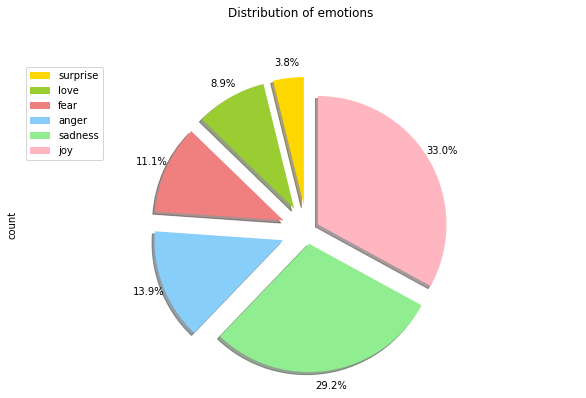

In [ ]:
colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'lightpink']
explode_list = [0.2, 0.2, 0.2, 0.2, 0.1, 0.1]
df_plot["count"].plot(kind='pie',
                            figsize=(10, 6),
                            autopct='%1.1f%%', 
                            startangle=90,    
                            shadow=True,       
                            labels=None,         
                            pctdistance=1.12,     
                            colors=colors_list,  
                            explode=explode_list 
                            )


plt.title("Distribution of emotions", y=1.12) 

plt.axis('equal') 


plt.legend(labels=df_plot.index, loc='upper left') 

plt.show()

We notice our dataset is extremely unbalanced. We will need to take this fact into account later on in our analysis, especially when computing models' metrics.

##Boxplot

We further check the distribution of sentences' length within each emotion.

In [ ]:
fig = px.box(emotions, x="emotions", y="len_text")
fig.show()

In the above boxplot there are some outliers for each class. However, there are no peculiar differences in the text length distribution among emotions. We also see that the upper whisker is uniformly equal to $20$. 

So we will use $15$ as **maximum sentence length**. This is because we figured it would be better to deal with padded sentences, instead of truncating longer sentences risking to lose useful information.  

To get an additional confirmation that this is a reasonable idea, we plot the histogram for each emotion, representing distribution of the length of sentences.

In [ ]:
df = px.data.gapminder()
fig = px.histogram(emotions, x="len_text", animation_frame="emotions",
                   range_x=[0, 40], range_y=[0, 14000])
fig["layout"]
fig.show()

From the histograms we can notice how unbalanced labels effectively are, in terms of sentences' counts. However, it seems that $15$ words is a reasonable length, thus confirming our previous intuition.

In the following plot we can visualize a combination of boxplot and sentences' length distribution.

In [ ]:
fig = px.violin(emotions, y = "len_text", x = "emotions", color = 'emotions', 
                            color_discrete_sequence=colors_list,
                box = True, title ='Violin of Emotion vs Length')
fig.layout.update(showlegend = False)
fig.show()

## <font color=yellow> Word Clouds <font>

We proceed by plotting the word clouds to see whether some words are partciularly representative of an emotion.

In [ ]:
stopwords = set(nlp.Defaults.stop_words)
stopwords.add('feel')
stopwords.add('feeling')
stopwords.add('im')
stopwords.add('like')
stopwords.add('time')

In [ ]:
list_cloud = []
for i in emotions["emotions"].unique():
  a = i
  a = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
    ) 
  sub = emotions[emotions["emotions"]== i].reset_index()
  text = str()
  for j in sub.index:
    text = text + '...' + sub.iloc[j]['text']
  list_cloud.append(a.generate(text))

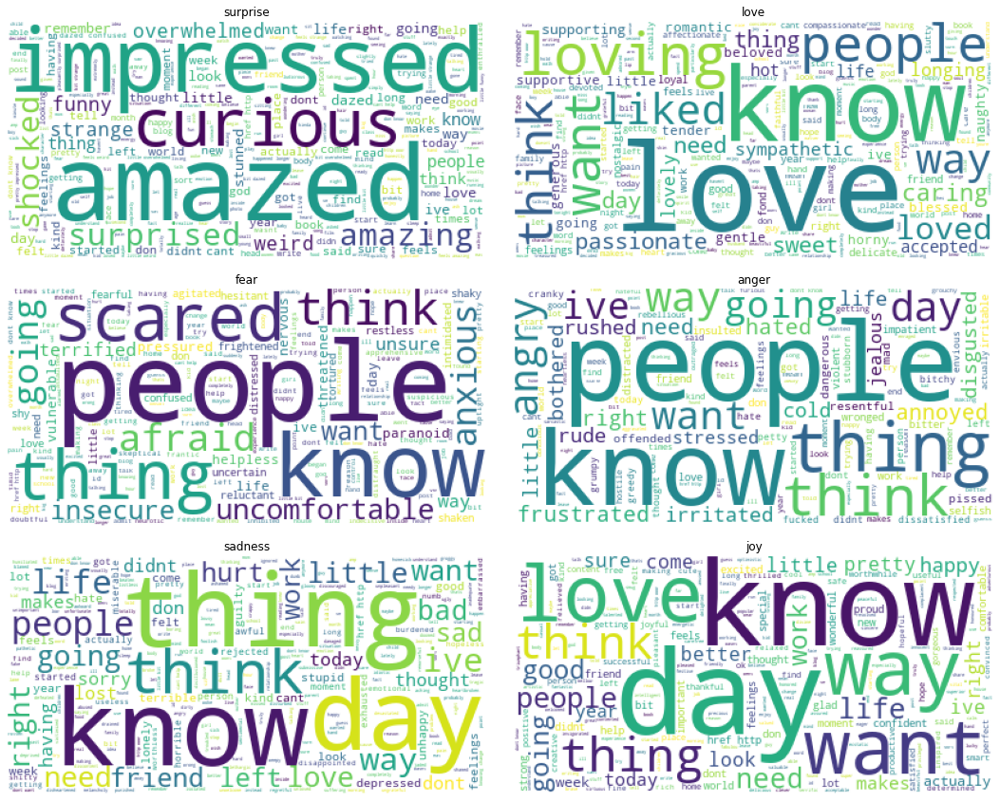

In [ ]:
fig = plt.figure(figsize=(20., 15.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(3, 2),  
                 axes_pad=0.4,  
                 )
idx = 0
for ax, im in zip(grid, [list_cloud[0], list_cloud[1], list_cloud[2], list_cloud[3], list_cloud[4], list_cloud[5]]):
    ax.grid(False)
    ax.axis('off')
    ax.set_title(str(emotions["emotions"].unique()[idx]))
    ax.imshow(im)
    idx+=1

plt.show()

## <font color=yellow> Useful functions <font>

We have defined our own function to split the dataset into train and test `dataset_split(perc)`, whose argument `perc` allows to define the percentage of the original dataset we want to use as train.



In [ ]:
def dataset_split(perc,emotions=emotions):
  p = 1 - perc
  name1 = pd.DataFrame(columns=["text", "emotions", "len_text"])
  name2 = pd.DataFrame(columns=["text", "emotions", "len_text"])

  for i in sorted_emotions:

    data = emotions[emotions["emotions"] == i].reset_index().drop(["index"], axis=1, inplace=False)
    idx = np.arange(len(data))

    idx_1 = list(np.random.choice(idx, int(len(idx)*p), replace=False))
    name1 = pd.concat([name1, data.drop(idx_1, axis=0,  inplace=False)], axis=0)

    idx_2 = [item for item in idx if item not in idx_1]
    name2  = pd.concat([name2, data.drop(idx_2, axis=0, inplace=False)], axis=0)

    name1 = name1.sample(frac = 1)
    name2 = name2.sample(frac = 1)
    
  return name1.reset_index(), name2.reset_index()

  

We split our data into train and test set.

In [ ]:
train , test = dataset_split(0.8)

In [ ]:
train.shape, test.shape

((299603, 4), (74896, 4))

The following define some functions to visualize the metrics.

In [ ]:
def plot_confusion_matrix(y_preds, y_true, labels):
    cm = confusion_matrix(y_true, y_preds, normalize="true")
    fig, ax = plt.subplots(figsize=(6, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(cmap="Blues", values_format=".2f", ax=ax, colorbar=False)
    plt.title("Normalized confusion matrix")
    plt.show()

In [ ]:
def ConfusionMatrixPercent(y_test, y_pred):
  cf_matrix = confusion_matrix(y_test, y_pred)
  tot = np.sum(np.sum(cf_matrix))
  cf_matrix = cf_matrix/tot
  y_list = list(y_test)

  a = "{:.1%}".format(y_list.count(0)/tot)
  b = "{:.1%}".format(y_list.count(1)/tot)
  c = "{:.1%}".format(y_list.count(2)/tot)
  d = "{:.1%}".format(y_list.count(3)/tot)
  e = "{:.1%}".format(y_list.count(4)/tot)
  f = "{:.1%}".format(y_list.count(5)/tot)
  group_names = [str('('+a+')'),'', '','','','','',
                str('('+b+')'),'', '','','','','',
                str('('+c+')'),'', '','','','','',
                str('('+d+')'),'', '','','','','',
                str('('+e+')'),'', '','','','','',
                str('('+f+')'),'', '','','','','']
  group_percentages = ["{0:.2%}".format(value) for value in
                      cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f"{v1}\n{v2}" for v1, v2 in
            zip(group_names, group_percentages)]
  labels = np.asarray(labels).reshape(6,6)
  sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
  plt.title('Confusion Matrix', fontsize = 15)
  plt.ylabel('True', fontsize = 15) 
  plt.xlabel('Predicted', fontsize = 15) 

#  <font color=yellow>Models <font>

## <font color=green> Keras <font>

The first neural network model that we have implemented uses **Keras Embedding layer**. The latter is followed by an **LSTM**, which ensures to keep memory of the order of words within each sentence. After LSTM we add a **Gaussian Noise** layer that prevents overfitting issues, and finally we conclude with a **Fully connected layer**, which uses as activation function `softmax`.

We define `keras_data_X_Y` function to prepare our data for the Keras Embedding Layer of the model. 
This function returns: 
- `X`:  sentences' words are transformed into their corresponding vocabulary index; sentnces are padded to maximum length of $15$, as stated before.
- `Y`: labels are encoded to integers from $0$ to $5$.
- `embed_dim`: represents vocabulary length, which is a required argument for the Embedding layer.

In [ ]:
def keras_data_X_Y(data,padd):
  data = data
  tokenizer = Tokenizer(split=' ')
  tokenizer.fit_on_texts(data['text'].values)
  X = tokenizer.texts_to_sequences(data['text'].values)
  X = tf.keras.preprocessing.sequence.pad_sequences(X, maxlen = padd)
  Y = []
  for i in range(len(data)): 
    y = [idx for idx in range(len(sorted_emotions)) if data.iloc[i]['emotions'] == sorted_emotions[idx]]
    Y.append(y[0])
  embed_dim = len(tokenizer.word_index)+1
  return X, np.array(Y), embed_dim

In [ ]:
X_train, Y_train, embed_dim = keras_data_X_Y(train,15)
X_test, Y_test, _ = keras_data_X_Y(test,15)

In [ ]:
X_train.shape

(299603, 15)

In [ ]:
embed_dim

67099

From the beginning we noticed that our classes were strongly unbalanced. Therefore, below we compute **weights** to be used in the loss function computation to evenly weight instances of different classes.

In [ ]:
weights = cw.compute_class_weight(classes = np.unique(Y_train), class_weight="balanced", y=Y_train)
class_weights = {k: v for k, v in zip(np.unique(Y_train), weights)}

The following code creates the architecture of the model. We compile the model with: 
- `SparseCategoricalCrossentropy`, coherent with our labels' encoding
- `SparseCategoricalAccuracy`, coherent with the loss
- **Adam** optimizer

In [ ]:
nn = Sequential()
nn.add(Embedding(embed_dim, 100, input_length = 15))
nn.add(LSTM(20, dropout=0.2, recurrent_dropout=0.2, go_backwards = True))
nn.add(GaussianNoise(0.5))
nn.add(Dense(6,activation='softmax'))
nn.compile(loss = 'SparseCategoricalCrossentropy', optimizer='adam',metrics = ['SparseCategoricalAccuracy'])
print(nn.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 15, 100)           6723000   
                                                                 
 lstm_1 (LSTM)               (None, 20)                9680      
                                                                 
 gaussian_noise_1 (GaussianN  (None, 20)               0         
 oise)                                                           
                                                                 
 dense_1 (Dense)             (None, 6)                 126       
                                                                 
Total params: 6,732,806
Trainable params: 6,732,806
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
batch_size = 16
history_keras = nn.fit(X_train, Y_train, epochs = 5, batch_size=batch_size, verbose = 2, class_weight=class_weights)

Epoch 1/5
18726/18726 - 931s - loss: 0.2460 - sparse_categorical_accuracy: 0.9157 - 931s/epoch - 50ms/step
Epoch 2/5
18726/18726 - 932s - loss: 0.1038 - sparse_categorical_accuracy: 0.9671 - 932s/epoch - 50ms/step
Epoch 3/5
18726/18726 - 925s - loss: 0.0794 - sparse_categorical_accuracy: 0.9753 - 925s/epoch - 49ms/step
Epoch 4/5
18726/18726 - 931s - loss: 0.0657 - sparse_categorical_accuracy: 0.9799 - 931s/epoch - 50ms/step
Epoch 5/5
18726/18726 - 922s - loss: 0.0555 - sparse_categorical_accuracy: 0.9827 - 922s/epoch - 49ms/step


We can appreciate training loss' decrease and training accuracy's increase. This makes us hope that also on the test we can get quite good results.

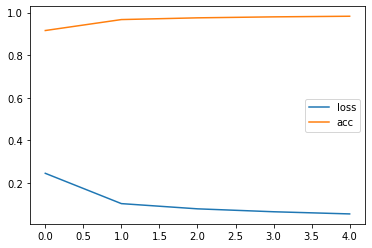

In [ ]:
plt.plot(history_keras.history['loss'], label='loss')
plt.plot(history_keras.history['sparse_categorical_accuracy'], label='acc')
plt.legend()
plt.show()

In [ ]:
predictions_keras = nn.predict(X_test) 
prediction_keras  = np.argmax(predictions_keras,axis=1)
print(prediction_keras[-10:],Y_test[-10:])

2341/2341 [==============================] - 13s 6ms/step
[4 3 2 4 5 3 3 5 2 2] [4 2 5 4 4 5 5 5 2 4]


In [ ]:
score,acc = nn.evaluate(X_test, Y_test, verbose = 2, batch_size = batch_size)
print("acc: %.2f" % (acc))

4681/4681 - 26s - loss: 4.9810 - sparse_categorical_accuracy: 0.2735 - 26s/epoch - 6ms/step
acc: 0.27


We face a problem since test accuracy is low $27\%$.

In [ ]:
nn.save("/content/drive/MyDrive/Colab Notebooks/keras_model.h5")

### Dummy Classifier

We compare the test accuracy of the model with some random labelling strategies.
- **Most frequent**: it classifies all the images with the class label with the highest frequency;

- **Stratified**: keeps into consideration the proportion of unbalanced classes;

- **Uniform**: applies a uniform distribution on the labels;

- **Constant**: all images are classified in a class of our choice.


In [ ]:
strategies = ['most_frequent', 'stratified', 'uniform', 'constant']
  
test_scores = []
for s in strategies:
    if s =='constant':
        dclf = sklearn.dummy.DummyClassifier(strategy = s, random_state = 0, constant = 5)
    else:
        dclf = sklearn.dummy.DummyClassifier(strategy = s, random_state = 0)
    dclf.fit(X_train, Y_train)
    score = dclf.score(X_test, Y_test)
    test_scores.append(score)

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


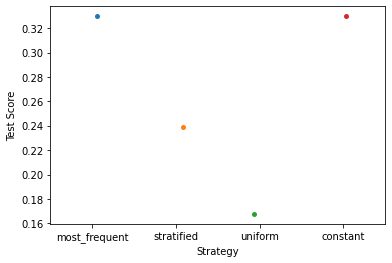

In [ ]:
ax = sns.stripplot(strategies, test_scores);
ax.set(xlabel ='Strategy', ylabel ='Test Score')
plt.show()

### Metrics

We see that our **test accuracy** $(27\%)$ is even lower than the ones obtained by Most Frequent and constant dummy classifier. However, since our dataset is strongly unbalanced, we know that we should not trust this metric so much. So, we further investigate the performance of this model by visualizing the confusion matrix.

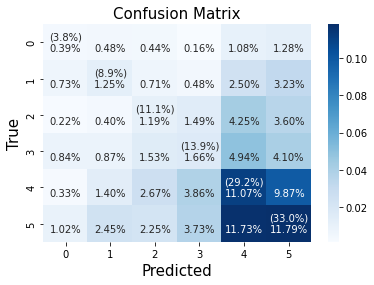

In [ ]:
ConfusionMatrixPercent(Y_test, prediction_keras)

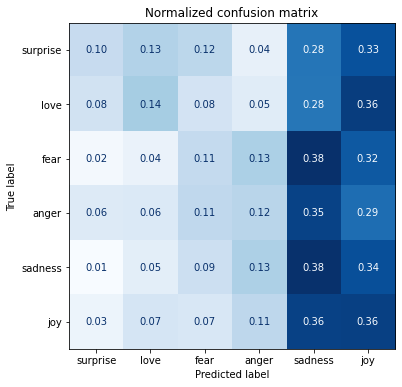

In [ ]:
plot_confusion_matrix(prediction_keras, Y_test, sorted_emotions)

From the normalized confusion matrix, we see that our model performs very poorly on those emotions whose number of sentences is small. This holds true also by looking at the classification report.

In [ ]:
print(classification_report(Y_test, prediction_keras))

              precision    recall  f1-score   support

           0       0.11      0.10      0.11      2878
           1       0.18      0.14      0.16      6671
           2       0.14      0.11      0.12      8346
           3       0.15      0.12      0.13     10438
           4       0.31      0.38      0.34     21871
           5       0.35      0.36      0.35     24692

    accuracy                           0.27     74896
   macro avg       0.21      0.20      0.20     74896
weighted avg       0.26      0.27      0.27     74896



We are definitely not satisfied of the results obtained on the test by this first model. Hence we have decided to try to improve these results by adopting **GloVe** to vectorize words. By doing so, we hope to improve the model's performance.

## <font color=green> GloVe <font>

We have decided to use the pretrained **GloVe** version that associates each word to a vector of $300$ elements. This encoding should now be able to better represent words, leading to vectors whose cosine distance should represent how semantically close two words are.

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
w2v_o_f = "glove.6B.300d.txt" + ".word2vec"
glove2word2vec("/content/drive/MyDrive/Text Mining Project/glove.6B.300d.txt", word2vec_output_file=w2v_o_f)

(400000, 300)

In [ ]:
model = KeyedVectors.load_word2vec_format(w2v_o_f, binary=False)

The function `transform` allows us to transform our original sentences into their corresponding matrix representation. Indeed, the output of  `transform` (`X_data`) is a $3$ dimensional array having: 
- a number of matrices that corresponds to the number of rows on the given dataset
- each matrix has $15$ rows: these represent the allowed maximum length of each sentence. For sentences longer than $15$, we decided to randomly choose words to be dropped.
- each matrix has $300$ columns: this means that each of the $15$ words in a sentence is encoded into a $300-$elements vector.

In [ ]:
def transform(data, chosen_model, max_sent_len=15):
  S = 300  # vector_size
  X_data = np.zeros((len(data), max_sent_len, S))
  m = 0
  for sentence in data:
    tokens = sentence.split()
    X = np.zeros((max_sent_len, S))
    n = 0
    if len(tokens) > 15:
      idx = np.random.choice(len(tokens), 15, replace=False)
      tokens = [tokens[i] for i in idx]
    for word in tokens:
      try:
        vec = chosen_model.get_vector(word)
        X[n, :] = vec
        n += 1
      except KeyError:
        pass
    X_data[m, :, :] = X
    m += 1
  return X_data


The function `data_X_Y` allows to perform the above transformation on the sentences, whereas labels are encoded with an integer number (ranging from $0$ to $5$) indicating the corresponding emotion. 

In [ ]:
def data_X_Y(data, model):
  data = data
  X = transform(data['text'], model)
  Y = []
  for i in range(len(data)): 
    y = [idx for idx in range(len(sorted_emotions)) if data.iloc[i]['emotions'] == sorted_emotions[idx]]
    Y.append(y[0])
  return X, np.array(Y)

In [ ]:
X_train ,Y_train = data_X_Y(train,model)
X_test, Y_test = data_X_Y(test,model)

In [ ]:
X_train.shape

(209724, 15, 300)

The neural network can be fed directly the data we have trasformed by ourselves. This allows us to skip the Embedding layer, and let the data directly flow in the **LSTM** layer. We added to the architecture a **Gaussian Noise** layer to discourage overfitting, and then we end with a **Fully connected layer**, that uses `softmax` activation function as we did before.

In [ ]:
lstm_out = 196

nn = Sequential()
nn.add(LSTM(20, dropout=0.2, recurrent_dropout=0.2, go_backwards = True))
nn.add(GaussianNoise(0.5))
nn.add(Dense(6,activation='softmax'))
nn.compile(loss = 'SparseCategoricalCrossentropy', optimizer='adam',metrics = ['SparseCategoricalAccuracy'])
nn.build(X_train.shape)
print(nn.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (299603, 20)              25680     
                                                                 
 gaussian_noise (GaussianNoi  (299603, 20)             0         
 se)                                                             
                                                                 
 dense (Dense)               (299603, 6)               126       
                                                                 
Total params: 25,806
Trainable params: 25,806
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
batch_size     = 16
history_glove1 = nn.fit(X_train, Y_train, epochs = 5, batch_size=batch_size, verbose = 2, class_weight=class_weights)

Epoch 1/5
18726/18726 - 702s - loss: 0.4405 - sparse_categorical_accuracy: 0.8365 - 702s/epoch - 37ms/step
Epoch 2/5
18726/18726 - 696s - loss: 0.2755 - sparse_categorical_accuracy: 0.9048 - 696s/epoch - 37ms/step
Epoch 3/5
18726/18726 - 698s - loss: 0.2486 - sparse_categorical_accuracy: 0.9146 - 698s/epoch - 37ms/step
Epoch 4/5
18726/18726 - 697s - loss: 0.2379 - sparse_categorical_accuracy: 0.9188 - 697s/epoch - 37ms/step
Epoch 5/5
18726/18726 - 696s - loss: 0.2306 - sparse_categorical_accuracy: 0.9210 - 696s/epoch - 37ms/step


Also for this model we can see that train loss decreases and train accuracy increases among the epochs.

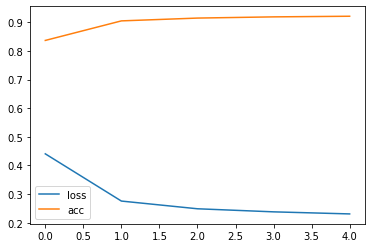

In [ ]:
plt.plot(history_glove1.history['loss'], label='loss')
plt.plot(history_glove1.history['sparse_categorical_accuracy'], label='acc')
plt.legend()
plt.show()

#plt.savefig("Loss plt.jpg")

In [ ]:
predictions_glove1 = nn.predict(X_test) 
predictions_glove1 = np.argmax(predictions_glove1,axis=1)
print("\n")
print(Y_test[:10], predictions_glove1[:10])

2341/2341 [==============================] - 14s 6ms/step


[5 4 5 5 5 4 2 3 3 3] [5 4 5 5 5 4 2 3 3 3]


In [ ]:
score, acc = nn.evaluate(X_test, Y_test, verbose = 2, batch_size = batch_size)
print("acc: %.2f" % (acc))

4681/4681 - 28s - loss: 0.1785 - sparse_categorical_accuracy: 0.9447 - 28s/epoch - 6ms/step
acc: 0.94


In [ ]:
nn.save("/content/drive/MyDrive/Colab Notebooks/glove1_model.h5")

We get a very high  test accuracy $94\%$. However, we further investigate model's performance by looking at the confusion matrix and classification report.

Metrics:

For each cell, in the paranthesis we have the percentage that our model would have reached if all test labels were correctly classified.
We catch sight of how close our model's results are to the empirical percentages (i.e. the ones in braces)

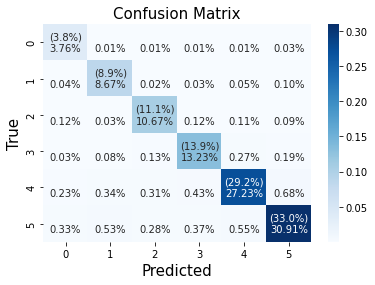

In [ ]:
ConfusionMatrixPercent(Y_test, predictions_glove1)

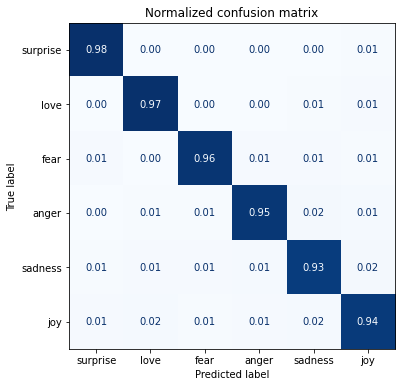

In [ ]:
plot_confusion_matrix(predictions_glove1, Y_test, sorted_emotions)

In [ ]:
print(classification_report(Y_test, predictions_glove1))

              precision    recall  f1-score   support

           0       0.83      0.98      0.90      2878
           1       0.90      0.97      0.93      6671
           2       0.93      0.96      0.95      8346
           3       0.93      0.95      0.94     10438
           4       0.96      0.93      0.95     21871
           5       0.97      0.94      0.95     24692

    accuracy                           0.94     74896
   macro avg       0.92      0.95      0.94     74896
weighted avg       0.95      0.94      0.94     74896



Going for GloVe has definitely improved our model performances. 

## <font color=green> GloVe hybrid model <font> 

We now try a slightly different approach, which uses Keras Embedding layer, containing Glove's weights as a way of encoding.

In [ ]:
Y = []
for i in range(len(emotions)): 
  y = [idx for idx in range(len(sorted_emotions)) if emotions.iloc[i]['emotions'] == sorted_emotions[idx]]
  Y.append(y[0])

In [ ]:
labels = np.asarray(Y)

In [ ]:
weights = cw.compute_class_weight(classes = np.unique(labels), class_weight="balanced", y=labels)
class_weights = {k: v for k, v in zip(np.unique(labels), weights)}

We proceed in the following way: 
- We compute the length of the vocabulary (`input_dim`)
- `sequences` transform our original sentences into sequences of vocabulary's indeces.
- `data` contains padded `sequences`
- We shuffle our data and then split it into train and test sets.

In [ ]:
tokenizer = Tokenizer()
texts = pd.concat([emotions["text"]],axis=0).astype("str")
tokenizer.fit_on_texts(texts)
word_index = tokenizer.word_index
input_dim = len(word_index) + 1
sequences = tokenizer.texts_to_sequences(texts)

data = pad_sequences(sequences, 15)
indices = np.arange(data.shape[0])
np.random.shuffle(indices)
data = data[indices]
labels = labels[indices]
nb_validation_samples = int(0.2 * data.shape[0])

x_train = data[:-nb_validation_samples]
y_train = labels[:-nb_validation_samples]
x_test = data[-nb_validation_samples:]
y_test = labels[-nb_validation_samples:]

In [ ]:
drive.mount("/content/drive")

Mounted at /content/drive


Firstly we create `embeddings_index`, a dictionary with words as keys, and their corresponding encoded vector as values.

In [ ]:
embeddings_index = {}
f = open("/content/drive/MyDrive/Text Mining Project/glove.6B.300d.txt")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


We now match the words' indeces contained in `word_index` to their embeddings contained in `embedding_index`. So that `embedding_matrix` contains for each word's index its corresponding vector, using GloVe encoder.

In [ ]:
embedding_matrix = np.zeros((input_dim, 300))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector

We build the same model as before, but adding an Embedding layer with **non-trainable weights**, since we use the `embedding_matrix` created before.

In [ ]:
lstm_out = 196

model_lg = Sequential()
model_lg.add(Embedding(input_dim, 300, weights=[embedding_matrix], input_length=15, trainable=False))
model_lg.add(LSTM(lstm_out, dropout=0.2, recurrent_dropout=0.2))
model_lg.add(Dense(6,activation='softmax'))
model_lg.compile(loss = 'SparseCategoricalCrossentropy', optimizer='adam',metrics = ['sparse_categorical_accuracy'])


In [ ]:
batch_size = 16
model_lg.fit(x_train, y_train, epochs = 5, batch_size = batch_size, verbose = 2)

Epoch 1/5
18725/18725 - 393s - loss: 0.1470 - sparse_categorical_accuracy: 0.9517 - 393s/epoch - 21ms/step
Epoch 2/5
18725/18725 - 380s - loss: 0.0715 - sparse_categorical_accuracy: 0.9767 - 380s/epoch - 20ms/step
Epoch 3/5
18725/18725 - 377s - loss: 0.0615 - sparse_categorical_accuracy: 0.9796 - 377s/epoch - 20ms/step
Epoch 4/5
18725/18725 - 375s - loss: 0.0547 - sparse_categorical_accuracy: 0.9814 - 375s/epoch - 20ms/step
Epoch 5/5
18725/18725 - 376s - loss: 0.0506 - sparse_categorical_accuracy: 0.9830 - 376s/epoch - 20ms/step


In [ ]:
model_lg.save("/content/drive/MyDrive/Text Mining Project/model_glove2.h5")

In [ ]:
predictions_glove2 = model_lg.predict(x_test) 
predictions_glove2 = np.argmax(predictions_glove2, axis=1)
print("\n")
print(predictions_glove2[-10:], y_test[-10:])

2341/2341 [==============================] - 12s 5ms/step


[5 5 4 1 4 1 5 2 4 2] [5 4 4 1 4 1 5 2 4 2]


We see the well behaved train loss and train accuracy.

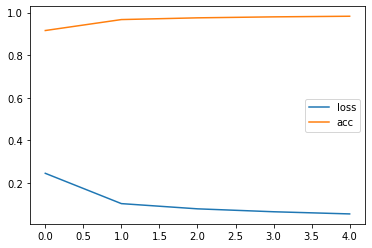

In [ ]:
plt.plot(history_keras.history['loss'], label='loss')
plt.plot(history_keras.history['sparse_categorical_accuracy'], label='acc')
plt.legend()
plt.show()

#plt.savefig("Loss plt.jpg")

In [ ]:
score, acc = model_lg.evaluate(x_test, y_test, verbose = 2, batch_size = batch_size)
print("acc: %.2f" % (acc))

4682/4682 - 28s - loss: 0.0753 - sparse_categorical_accuracy: 0.9779 - 28s/epoch - 6ms/step
acc: 0.98


We have reached $98\%$ of accuracy on test set! To be more confident of our good result, we plot the confusion matrices.

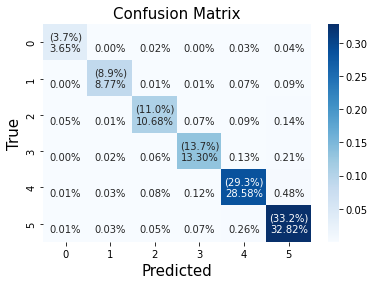

In [ ]:
ConfusionMatrixPercent(y_test, predictions_glove2)

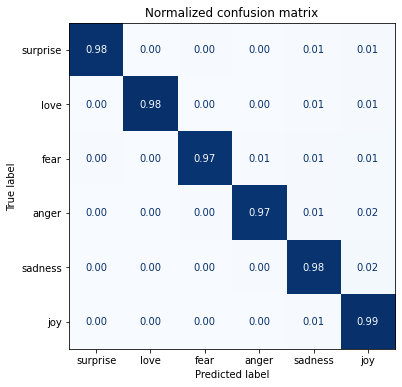

In [ ]:
plot_confusion_matrix(predictions_glove2, y_test, sorted_emotions)

The hybrid model created with a freezed Keras Embedding layer gives even better results as the previous GloVe model. Thus validating both procedures. 

By printing the classification report we see that both precision and recall (hence F1 score) are very high for all the emotions.

In [ ]:
print(classification_report(y_test, predictions_glove2))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2798
           1       0.99      0.98      0.98      6703
           2       0.98      0.97      0.97      8276
           3       0.98      0.97      0.97     10281
           4       0.98      0.98      0.98     21941
           5       0.97      0.99      0.98     24900

    accuracy                           0.98     74899
   macro avg       0.98      0.98      0.98     74899
weighted avg       0.98      0.98      0.98     74899



## <font color=green> DistilBert <font>

We want to compare the outstanding performances of the GloVe models with Bert.
In the follwoing sections we try two slightly different approaches to fine-tune a BERT model.

### <font color=green> DBert 1 <font>

Below we load the pre-trained DistilBert tokenizer. We chose DistilBert because it allows to reduce the number of weights, without affecting performances. 

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('distilbert-base-uncased')

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

In order to prepare our dataset for the implementation of the BERT model we start encoding our labels from emotions to their corresponding indeces.

In [ ]:
Y_train = []
for i in range(len(train)): 
  y = [idx for idx in range(len(sorted_emotions)) if train.iloc[i]['emotions'] == sorted_emotions[idx]]
  Y_train.append(y[0])

Y_test = []
for i in range(len(test)): 
  y = [idx for idx in range(len(sorted_emotions)) if test.iloc[i]['emotions'] == sorted_emotions[idx]]
  Y_test.append(y[0])

In [ ]:
train["emotions"] = Y_train
test["emotions"]  = Y_test

We drop useless columns for DBert's implementation from both the train and test sets. 

In [ ]:
train.drop(["index", "len_text"], axis = 1, inplace = True)

In [ ]:
train.rename(columns = {"emotions": "label"}, inplace = True)

In [ ]:
test.drop(["index", "len_text"], axis = 1, inplace = True)

In [ ]:
test.rename(columns = {"emotions":"label"}, inplace = True)

Our train and test sets are ready to be loaded as Dataset object. 

In [ ]:
train_db = Dataset.from_pandas(train)
test_db = Dataset.from_pandas(test)

We define `tokenize` that allows us to tokenize accordingly to DBert requirements, by padding those sentences smaller than the model's maximum context size of 512.

It returns a dictionary composed of *input_ids*, which is the list of the words' indeces, and the *attention_mask* for the next step.

Then we apply the function over each sentence of both the train and the test datasets by making use of the `map` function.

In [ ]:
def tokenize(batch):
    return tokenizer(batch["text"], padding=True, truncation=True)

train_encoded = train_db.map(tokenize, batched=True, batch_size=None)

  0%|          | 0/1 [00:00<?, ?ba/s]

In [ ]:
print(train_encoded.column_names)

['text', 'label', 'input_ids', 'attention_mask']


In [ ]:
test_encoded = test_db.map(tokenize, batched=True, batch_size=None)

  0%|          | 0/1 [00:00<?, ?ba/s]

We decide to apply the fine-tuning approach right away to obtain the best classification results.

In order to do so we define `model` which istantiate `AutoModelForSequenceClassification` that is characterized by having a classification head on top of the model outputs. 

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
                      
num_labels = 6
model = (AutoModelForSequenceClassification.from_pretrained("distilbert-base-uncased", num_labels=num_labels)
         .to(device))

Downloading:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_transform.bias', 'vocab_projector.weight', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier.bias', 'classifier.bias', 'pre_classifi

We define some required arguments to instantiate `Trainer`, and the function `compute_metrics` for specifying some metrics that will be used later in the discussion. 

In [ ]:
def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    f1 = f1_score(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    return {"accuracy": acc, "f1": f1}

In [ ]:
from transformers import Trainer, TrainingArguments

batch_size = 16
logging_steps = len(train_encoded) // batch_size
model_name = "distilbert-base-uncased""-finetuned-emotion"
training_args = TrainingArguments(output_dir=model_name,
                                  num_train_epochs=2,
                                  learning_rate=2e-5,
                                  per_device_train_batch_size=batch_size,
                                  per_device_eval_batch_size=batch_size,
                                  weight_decay=0.01,
                                  evaluation_strategy="epoch",
                                  disable_tqdm=False,
                                  logging_steps=logging_steps,
                                  push_to_hub=False, 
                                  log_level="error")

In [ ]:
trainer = Trainer(model=model, args=training_args, 
                  compute_metrics=compute_metrics,
                  train_dataset=train_encoded,
                  eval_dataset=test_encoded,
                  tokenizer=tokenizer)
trainer.train()

/usr/local/lib/python3.8/dist-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.062900,0.029211,0.992443,0.992443
2,0.021800,0.029976,0.992950,0.992950


TrainOutput(global_step=37452, training_loss=0.042345857138688985, metrics={'train_runtime': 5600.9878, 'train_samples_per_second': 106.982, 'train_steps_per_second': 6.687, 'total_flos': 1.3798636877119896e+16, 'train_loss': 0.042345857138688985, 'epoch': 2.0})

We notice straight away that even in just two epochs we have a test accuracy very high and stable around the value of 99%. 

We decide to further investigate the actual correctness of the predictions by computing those metrics defined in the previous function (f1 score and accuracy), alongside with the confusion matrix. 

In [ ]:
preds_output = trainer.predict(test_encoded)
preds_output.metrics
y_preds_bert1  = np.argmax(preds_output.predictions, axis=1)
y_test        = np.array(test_encoded["label"])

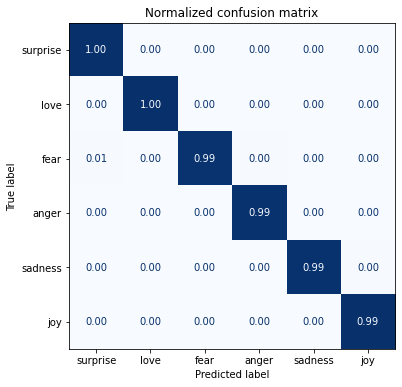

In [ ]:
plot_confusion_matrix(y_preds_bert1, y_test, sorted_emotions)

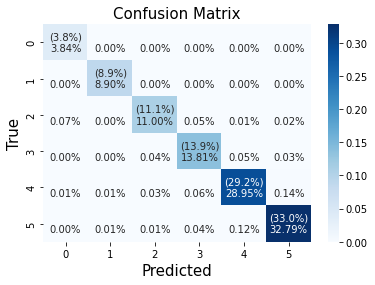

In [ ]:
ConfusionMatrixPercent(y_test, y_preds_bert1)

As we expected both the confusion matrices, the normalized one and the proportional one, show the extreme accuracy of our predictions, which is also confirmed by the metrics printed below.

In [ ]:
print('Classification Report')
print(classification_report(y_test, y_preds_bert1, target_names = sorted_emotions))

Classification Report
              precision    recall  f1-score   support

    surprise       0.98      1.00      0.99      2878
        love       1.00      1.00      1.00      6671
        fear       0.99      0.99      0.99      8346
       anger       0.99      0.99      0.99     10438
     sadness       0.99      0.99      0.99     21871
         joy       0.99      0.99      0.99     24692

    accuracy                           0.99     74896
   macro avg       0.99      0.99      0.99     74896
weighted avg       0.99      0.99      0.99     74896



#### Hive Plot

Here, we are interested in visualising a representation of the emotions by manually extracting the hidden states, which we implicitly use to train the classifier, and plotting the features.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AutoModel.from_pretrained("distilbert-base-uncased").to(device)

Downloading:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.weight', 'vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
def extract_hidden_states(batch):
    inputs = {k:v.to(device) for k,v in batch.items() 
              if k in tokenizer.model_input_names}
    with torch.no_grad():
        last_hidden_state = model(**inputs).last_hidden_state
    return {"hidden_state": last_hidden_state[:,0].cpu().numpy()}

In [ ]:
train_encoded.set_format("torch", 
                            columns=["input_ids", "attention_mask", "label"])

In [ ]:
train_hidden = train_encoded.map(extract_hidden_states, batched=True)

  0%|          | 0/300 [00:00<?, ?ba/s]

In [ ]:
train_hidden.column_names

['text', 'label', 'input_ids', 'attention_mask', 'hidden_state']

In [ ]:
X_train = np.array(train_hidden["hidden_state"])
y_train = np.array(train_hidden["label"])
X_train.shape

(299603, 768)

In [ ]:
X_scaled = MinMaxScaler().fit_transform(X_train)
mapper = umap.UMAP(n_components=2, metric="cosine").fit(X_scaled)
df_emb = pd.DataFrame(mapper.embedding_, columns=["X", "Y"])
df_emb["label"] = y_train
df_emb.head()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 7.0 MB/s 
     |████████████████████████████████| 1.1 MB 92.6 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=460b37286bb7957efba99310f70b90e0f1002de1e4891e2454d29792171ecc2b
  Stored in directory: /root/.cache/pip/wheels/a9/3a/67/06a8950e053725912e6a8c42c4a3a241410f6487b8402542ea
  Created wheel for pynndescent: filename=pynndescent-0.5.8-py3-none-any.whl size=55513 sha256=6e09592348b90af031509445dc2666d77d763da11b358c01c5d7ff63c2ba9eb7
  Stored in directory: /root/.cache/pip/wheels/1c/63/3a/29954bca1a27ba100ed8c27973a78cb71b43dc67aed62e80c3
Successfully built umap-learn pynndescent


,X,Y,label
0,-2.944059,2.223920,0
1,1.297170,-0.848896,3
2,2.750489,2.074567,4
3,0.351238,0.504109,5
4,6.866499,-0.229339,2


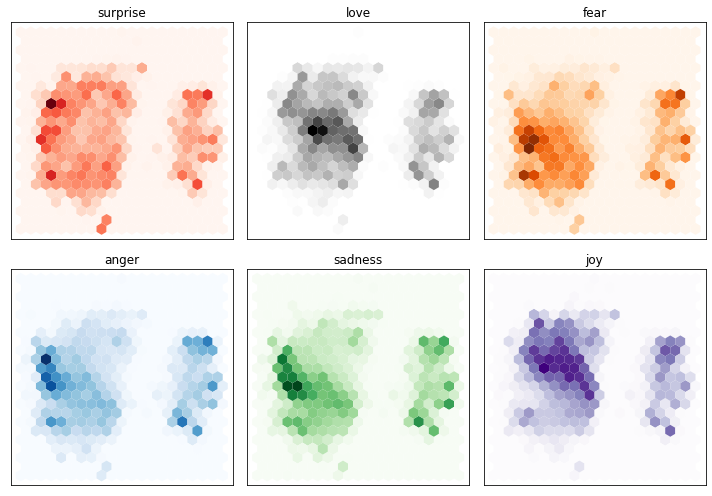

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(10,7))
axes = axes.flatten()
cmaps = ["Reds", "Yellows", "Oranges", "Blues", "Greens",  "Purples"]
labels = sorted_emotions

for i, (label, cmap) in enumerate(zip(labels, cmaps)):
    df_emb_sub = df_emb.query(f"label == {i}")
    axes[i].hexbin(df_emb_sub["X"], df_emb_sub["Y"], cmap=cmap,
                   gridsize=20, linewidths=(0,))
    axes[i].set_title(label)
    axes[i].set_xticks([]), axes[i].set_yticks([])

plt.tight_layout()
plt.show()

As is possible to see from the plot above all emotions cover similar regions but with visible variations in the distributions.

We notice that *joy* and *love* share some of the peaks of the distribution while being clearly different from 'negative' emotions such as *sadness*, *anger* and *fear*. Only *surprise* seems to share portions of its distibution with *anger* and, in some extents, *sadness*. 

Finally, since is noticeable even just by looking at this plot that each emotions as its own specific distribution, we are not suprised by the extreme capability of the model in predicting them.

### <font color=green> DBert 2 <font> 

Instead of directly using `AutoModelForSequenceClassification`, we now want to build our own model to perform **fine-tuning**. Indeed, we know that Bert has been pretrained to understand and better encode words in vectorial representation, but by performing fine-tuning, the model should be able to specifically deal with our task of Sentiment Classification.

In [ ]:
dbert_tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

loading file vocab.txt from cache at /root/.cache/huggingface/hub/models--distilbert-base-uncased/snapshots/1c4513b2eedbda136f57676a34eea67aba266e5c/vocab.txt
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at None
loading file tokenizer_config.json from cache at /root/.cache/huggingface/hub/models--distilbert-base-uncased/snapshots/1c4513b2eedbda136f57676a34eea67aba266e5c/tokenizer_config.json


Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--distilbert-base-uncased/snapshots/1c4513b2eedbda136f57676a34eea67aba266e5c/config.json
Model config DistilBertConfig {
  "_name_or_path": "distilbert-base-uncased",
  "activation": "gelu",
  "architectures": [
    "DistilBertForMaskedLM"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "initializer_range": 0.02,
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "transformers_version": "4.25.1",
  "vocab_size": 30522
}



In [ ]:
dbert_model = TFDistilBertModel.from_pretrained('distilbert-base-uncased')

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--distilbert-base-uncased/snapshots/1c4513b2eedbda136f57676a34eea67aba266e5c/config.json
Model config DistilBertConfig {
  "activation": "gelu",
  "architectures": [
    "DistilBertForMaskedLM"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "initializer_range": 0.02,
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "transformers_version": "4.25.1",
  "vocab_size": 30522
}



Downloading:   0%|          | 0.00/363M [00:00<?, ?B/s]

loading weights file tf_model.h5 from cache at /root/.cache/huggingface/hub/models--distilbert-base-uncased/snapshots/1c4513b2eedbda136f57676a34eea67aba266e5c/tf_model.h5
Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertModel: ['vocab_projector', 'vocab_layer_norm', 'activation_13', 'vocab_transform']
- This IS expected if you are initializing TFDistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFDistilBertModel were initialized from the model checkpoint at distilbert-base-uncased.
If your task is similar to the task the model of the checkpoi

In [ ]:
max_len = 30 
sentences = emotions['text']
labels = []
for i in range(len(emotions)): 
  y = [idx for idx in range(len(sorted_emotions)) if emotions.iloc[i]['emotions'] == sorted_emotions[idx]]
  labels.append(y[0])

labels = np.asarray(labels)


The following code allows to define: 
- `input_ids` $\rightarrow$ an array that for each row contains sentences having words' indeces in the vocabulary
- `attention_masks `$\rightarrow$ an array with number of rows equals to number of sentences, with entries of $0$ or $1$ in correspondence with padded words and actual words respectively.

In [ ]:
input_ids       = []
attention_masks = []

for sent in sentences:
    dbert_inps = dbert_tokenizer.encode_plus(sent, add_special_tokens = True, max_length =max_len, pad_to_max_length = True,
                                             return_attention_mask = True, truncation=True)
    input_ids.append(dbert_inps['input_ids'])
    attention_masks.append(dbert_inps['attention_mask'])

input_ids       = np.asarray(input_ids)
attention_masks = np.array(attention_masks)

/usr/local/lib/python3.8/dist-packages/transformers/tokenization_utils_base.py:2336: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [ ]:
len(input_ids), len(attention_masks), len(labels)

(374499, 374499, 374499)

We now define `create_model` that builds our fine-tuned model. Notice that it takes as inputs our sentences encoded to indeces and their associated masks. Then we have a DBert layer, which allows to correctly encode the words. The outputs are taken as input of the sequential dense layers, followed by a Dropout to discourage overfitting. The model ends with a Dense layer, using `softmax `activation function, given our classification task. 

In [ ]:
def create_model():
    inps        = Input(shape = (max_len,), dtype='int64')
    masks       = Input(shape = (max_len,), dtype='int64')
    dbert_layer = dbert_model(inps, attention_mask=masks)[0][:,0,:]
    dense       = Dense(512, activation='relu', kernel_regularizer = regularizers.l2(0.01))(dbert_layer)
    dropout     = Dropout(0.7)(dense)
    pred        = Dense(6, activation='softmax',kernel_regularizer = regularizers.l2(0.01))(dropout)
    model       = tf.keras.Model(inputs=[inps, masks], outputs = pred)
    print(model.summary())
    return model

In [ ]:
model = create_model()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 30)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 30)]         0           []                               
                                                                                                  
 tf_distil_bert_model (TFDistil  TFBaseModelOutput(l  66362880   ['input_1[0][0]',                
 BertModel)                     ast_hidden_state=(N               'input_2[0][0]']                
                                one, 30, 768),                                                    
                                 hidden_states=None                                           

In order to check the robustness of this model we decide to split the dataset into **train, test and validation.** At each epoch the model is trained on the train set and validated on the validation set. Then, when we reach the $2$ epochs we check the accuracy of the model on the test data. In this way we can get aware of overfitting, and check the model robustness.

In [ ]:
trainval_inp, test_inp, trainval_label, test_label, trainval_mask, test_mask = train_test_split(input_ids, labels, attention_masks, test_size=0.1)
train_inp, val_inp, train_label, val_label, train_mask, val_mask = train_test_split(trainval_inp, trainval_label, trainval_mask, test_size=0.2)

print('Train inp shape {} Val input shape {}\nTrain label shape {} Val label shape {}\nTrain attention mask shape {} Val attention mask shape {}'.format(train_inp.shape,val_inp.shape,train_label.shape,val_label.shape,train_mask.shape,val_mask.shape))


Train inp shape (269639, 30) Val input shape (67410, 30)
Train label shape (269639,) Val label shape (67410,)
Train attention mask shape (269639, 30) Val attention mask shape (67410, 30)


The following coherently specifies Loss and Accuracy. We have decided to use Adam optimizer. These parameters are used to compile the fine-tuned model.

In [ ]:
loss      = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
metric    = tf.keras.metrics.SparseCategoricalAccuracy('accuracy')
optimizer = tf.keras.optimizers.Adam(learning_rate=3e-5)

model.compile(loss=loss, optimizer=optimizer, metrics=[metric])

In [ ]:
model.compile(loss=loss, optimizer = optimizer, metrics = [metric])

We are now ready to fit the model. At the end of each epoch, the current weights are used to perform prediction on validation set, as stated before.
We have noticed, that even at the end of the first epoch validation accuracy is very high, with a value of $99\%$.

In [ ]:
history_glove2 = model.fit([train_inp,train_mask], train_label,
                           batch_size= 16, epochs = 2, validation_data = ([val_inp,val_mask], val_label))

Epoch 1/2


/usr/local/lib/python3.8/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


16853/16853 [==============================] - 1244s 73ms/step - loss: 0.8382 - accuracy: 0.9788 - val_loss: 0.0811 - val_accuracy: 0.9903
Epoch 2/2
16853/16853 [==============================] - 1257s 75ms/step - loss: 0.0781 - accuracy: 0.9905 - val_loss: 0.0666 - val_accuracy: 0.9911


We now print the classification report for validation set, because we can not totally rely on accuracy, given the unbalanced data.

In [ ]:
preds_bert2  = model.predict([val_inp,val_mask],batch_size=16) #on the validation set
preds_bert2  = preds_bert2.argmax(axis=1)

print('Classification Report')
print(classification_report(val_label, preds_bert2, target_names = sorted_emotions))


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 30)]         0           []                               
                                                                                                  
 input_4 (InputLayer)           [(None, 30)]         0           []                               
                                                                                                  
 tf_distil_bert_model (TFDistil  TFBaseModelOutput(l  66362880   ['input_3[0][0]',                
 BertModel)                     ast_hidden_state=(N               'input_4[0][0]']                
                                one, 30, 768),                                                    
                                 hidden_states=None                                         

Both precision and recall are very high for all the classes. So we get very good results on validation set. 
The following shows training loss and accuracy. We see how fast training loss decreases.

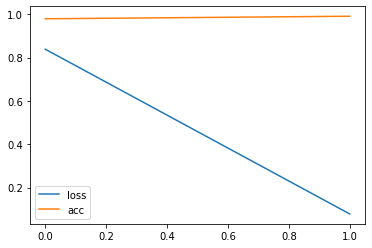

In [ ]:
plt.plot(history_glove2.history['loss'], label='loss')
plt.plot(history_glove2.history['accuracy'], label='acc')
plt.legend()
plt.show()

#plt.savefig("Loss plt.jpg")

We now check the performances of our fine-tuned model on totally unseen data (test set).

In [ ]:
preds_test_bert2   = model.predict([test_inp, test_mask], batch_size=16)
preds_test_bert2   = preds_test_bert2.argmax(axis=1)
print('Classification Report')
print(classification_report(test_label, preds_test_bert2, target_names = sorted_emotions))


2341/2341 [==============================] - 53s 23ms/step
Classification Report
              precision    recall  f1-score   support

    surprise       0.98      1.00      0.99      1449
        love       1.00      1.00      1.00      3323
        fear       0.98      0.99      0.99      4161
       anger       0.99      0.99      0.99      5226
     sadness       0.99      0.99      0.99     10843
         joy       0.99      0.99      0.99     12448

    accuracy                           0.99     37450
   macro avg       0.99      0.99      0.99     37450
weighted avg       0.99      0.99      0.99     37450



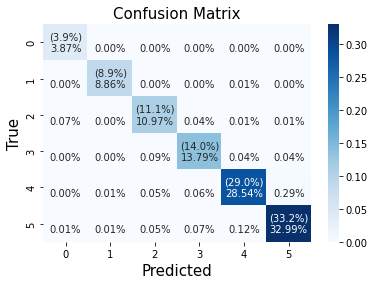

In [ ]:
ConfusionMatrixPercent(test_label, preds_test_bert2 )

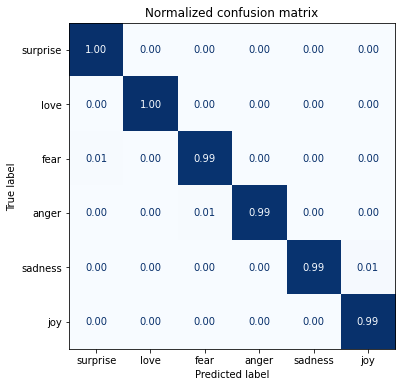

In [ ]:
plot_confusion_matrix(preds_test_bert2, test_label, sorted_emotions)

Test results are totally in line with what we got previously.

## <font color=yellow> Models' comparisons and conclusions <font>

We have started by using Keras Embedding Layer, followed by a simple arcitecture, esentially made of an LSTM layer, ending with a Linear layer with softmax activation function. These results were very poor, leading to a test accuracy of $27\%$, and poor classification report. When switching to GloVe Embedding, we have obtained oustanding results on test set, even on the same arcitecture. BERT led to a further improvement. We ae very satisfied of the performances of both GloVe and BERT models.